# Modeling exercise

## General Instructions

* Submission date: 25.4.2022
* Submission Method: Link to your solution notebook in [this sheet](https://docs.google.com/spreadsheets/d/1fTmjiVxzw_rM1hdh16enwUTtxzlHSJIiw41dJS2LKp0/edit?usp=sharing).

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys; sys.path.append('../../../Modles and Modeling/src')
import os
import numpy as np
import plotly_express as px

In [3]:
import pandas as pd
import ipywidgets as widgets

## Datasets

In [4]:
from datasets import make_circles_dataframe, make_moons_dataframe

### Moons dataset

In [5]:
from sklearn.datasets import make_moons

In [6]:
moons_df = make_moons_dataframe(n_samples=1000, noise_level=0.1)
moons_df.head()

,x,y,label
0,1.563395,-0.112110,B
1,0.388276,-0.479038,B
2,-0.205694,0.989332,A
3,-0.778999,0.887891,A
4,0.228153,1.080561,A


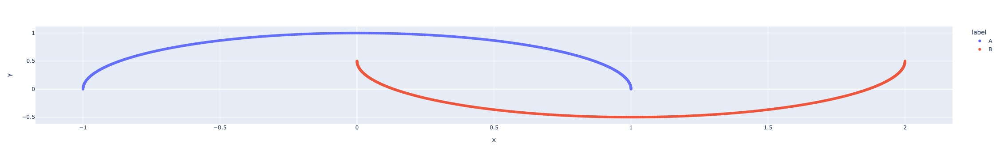

In [7]:
@widgets.interact
def plot_noisy_moons(noise_level = widgets.FloatSlider(value=0, min=0, max=0.5, step=0.05)):
    moons_df = make_moons_dataframe(n_samples=1000, noise_level=noise_level)
    return px.scatter(moons_df, x='x', y='y', color = 'label')

### Circles Dataset

In [8]:
circles_df = make_circles_dataframe(n_samples=500, noise_level=0)
circles_df.head()

,x,y,label
0,-0.137790,-0.990461,A
1,0.743821,0.294500,B
2,0.583175,-0.547638,B
3,0.774867,-0.198952,B
4,0.030152,0.799432,B


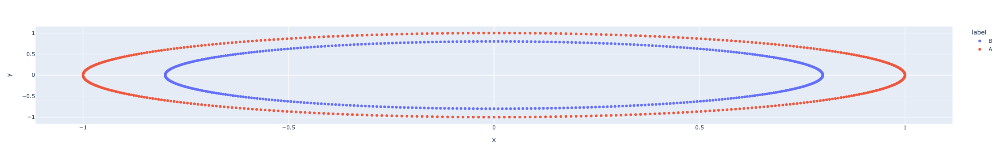

In [9]:
@widgets.interact
def plot_noisy_circles(noise_level = widgets.FloatSlider(value=0, min=0, max=0.5, step=0.05)):
    df = make_circles_dataframe(1000, noise_level)
    return px.scatter(df, x='x', y='y', color = 'label')

## Fitting and Overfiting 

The goal of the following exercise is to:
* Observe overfitting due to insuffient data
* Observe Overfitting due to overly complex model
* Identify the overfitting point by looking at Train vs Test error dynamic
* Observe how noise levels effect the needed data samples and model capacity

To do so, you'll code an experiment in the first part, and analyze the experiment result in the second part.

### Building an experiment

Code:

1. Create data of size N with noise level of magnitude NL from datasets DS_NAME. 
1. Split it to training and validation data (no need for test set), use 80%-20%. 
1. Use Logistic regression and Choose one complex model of your choice: [KNN](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html), [SVM with RBF kernel](https://scikit-learn.org/stable/modules/svm.html) with different `gamma` values or [Random forest classifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) with differnt number of `min_samples_split`. 
1. Train on the train set for different hyper parameter values. compute:
   1. Classification accuracy on the training set (TRE)
   1. Classification accuracy on the validation set (TESTE)
   1. The difference beteen the two above (E_DIFF)
1. Save DS_NAME, N, NL, CLF_NAME, K, TRE, TESTE, E_DIFF and the regularization/hyper param (K, gamma or min_samples_split and regularization value for the linear regression classifier)

Repeat for:
* DS_NAME in Moons, Circles
* N (number of samples) in [5, 10, 50, 100, 1000, 10000]
* NL (noise level) in [0, 0.1, 0.2, 0.3, 0.4, 0.5]
* For the complex model: 10 Values of hyper parameter of the complex model you've chosen.
* For the linear model: 5 values of ridge (l2) regularization - [0.001, 0.01, 0.1, 1, 10, 100, 1000]

### Analysing the expermient results

1. For SVM only, For dataset of size 10k and for each dataset, What are the best model params? How stable is it? 
1. For SVM only, For dataset of size 10k and for each dataset, What is the most stable model and model params? How good is it in comparison to other models? Explain using bias and variance terminoligy.
1. Does regularization help for linear models? consider different datasets sizes. 
1. For a given noise level of your chioce, How does the train, test and difference error changes with increasing data sizes? (answer for svm and LR seperatly)
1. For a given noise level of your chioce, How does the train, test and difference error changes with increasing model complexity? (answer for svm and LR seperatly)
1. Are the noise level effect the number of datapoints needed to reach optimal test results? 

Bonus:

* For SVM: Select one dataset and with 0.2 noise level. Identify the optimal model params, and visualize the decision boundry learned. 
  * Hint: Use a grid. See classification models notebook 

## Tips and Hints

For buliding the experiment:

* Start with one dataframe holding all the data for both datastes with different noise level. Use the `make_<dataset_name>_dataframe()` functions below, and add two columns, dataset_name and noise_level, before appending the new dataset to the rest of the datasets. Use `df = pd.DataFrame()` to start with an empty dataframe and using a loop, add data to it using `df = df.append(<the needed df here>)`. Verify that you have 10k samples for each dataset type and noise level by a proper `.value_counts()`. You can modify the 
* When you'll need an N samples data with a specific noise level, use `query()` and `head(n)` to get the needed dataset. 
* Use sklearn `train_test_split()` method to split the data with `test_size` and `random_state` parameters set correctly to ensure you are always splitting the data the same why for a given fold `k`. Read [the docs](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) if needed. 
* You can also not create your own data splitter, and instead use `model_selection.cross_validate()` from sklearn. You'll need to ask for the train erros as well as the test errors, see [here](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html).
* Use prints in proper location to ensure the progress of the experiment. 

**If you get stuck, and need refernce, scroll to the end of the notebook to see more hints!**

## Experiment 

### Dataset preparation

In [10]:
from src.experiment import prepare_datasets

In [11]:
noise_levels = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
datasets = prepare_datasets(noise_levels)

In [12]:
datasets.groupby(['dataset_name','noise_level']).size()

dataset_name  noise_level
circles       0.0            10000
              0.1            10000
              0.2            10000
              0.3            10000
              0.4            10000
              0.5            10000
moons         0.0            10000
              0.1            10000
              0.2            10000
              0.3            10000
              0.4            10000
              0.5            10000
dtype: int64

In [13]:
datasets.head()

,x,y,label,dataset_name,noise_level
0,0.651834,0.758362,A,circles,0.0
1,0.501450,-0.865186,A,circles,0.0
2,-0.178734,0.983898,A,circles,0.0
3,0.526783,-0.602079,B,circles,0.0
4,0.982287,0.187381,A,circles,0.0


### Experiment procedure

In [14]:
from src.experiment import prepare_dataset_for_k_fold_cv

In [15]:
ds_type, nl = 'moons', 0
prepare_dataset_for_k_fold_cv(datasets.query('dataset_name == @ds_type and noise_level == @nl'),n_samples=15, k=5)

,x,y,label,dataset_name,noise_level,fold
0,-0.866705,0.498820,A,moons,0.0,0
1,-0.135016,0.990843,A,moons,0.0,1
2,0.855525,0.517762,A,moons,0.0,2
3,-0.991387,0.130968,A,moons,0.0,3
4,0.917722,0.397223,A,moons,0.0,4
5,-0.332587,0.943072,A,moons,0.0,0
6,-0.577930,0.816087,A,moons,0.0,1
7,0.010978,0.352230,B,moons,0.0,2
8,0.019654,0.302714,B,moons,0.0,3
9,0.165986,-0.051743,B,moons,0.0,4


In [16]:
datasets_type = ['circles', 'moons']
gamma_range = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
regularization_values = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
n_samples = [10, 20, 50, 100, 500, 1000]
k_folds = 5
clf_types = ['log_reg', 'svm']

In [17]:
from src.experiment import run_modeling_experiment
modeling_results_file_path = 'data/modeling_exercise_results.csv'
if not os.path.exists(modeling_results_file_path):
    results = run_modeling_experiment(datasets, datasets_type, noise_levels, gamma_range, regularization_values, n_samples, k_folds, clf_types)
    results_df = pd.DataFrame(results, columns=['ds_type','n_samples','noise_level','clf_type','param','k','train_acc','test_acc','error_diff'])
    results_df.to_csv(modeling_results_file_path)
else:
    results_df = pd.read_csv(modeling_results_file_path)

In [18]:
results_df.shape

(13440, 10)

In [19]:
results_df.tail()

,Unnamed: 0,ds_type,n_samples,noise_level,clf_type,param,k,train_acc,test_acc,error_diff
13435,13435,moons,10000,0.5,svm,0.1,9,0.812222,0.790,0.022222
13436,13436,moons,10000,0.5,svm,1.0,9,0.817111,0.798,0.019111
13437,13437,moons,10000,0.5,svm,10.0,9,0.817556,0.797,0.020556
13438,13438,moons,10000,0.5,svm,100.0,9,0.829667,0.796,0.033667
13439,13439,moons,10000,0.5,svm,1000.0,9,0.892778,0.751,0.141778


## Experiment Analysis

In [20]:
from src.analysis import apply_compute_acc_stats

In [21]:
results_df = pd.read_csv('data/modeling_exercise_results.csv')

### Q1

**For SVM only, For dataset of size 10k and for each dataset, What are the best model params? How stable is it?**

In [22]:
test_acc_by_conf = results_df.query("clf_type == 'svm' and n_samples == 10000" ).groupby(['ds_type', 'noise_level', 'param']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))
test_acc_by_conf.head()

test_acc_mean  test_acc_std  test_acc_cv  \
ds_type noise_level param                                              
circles 0.0         0.001          0.4946      0.027350     0.027350   
                    0.010          0.5806      0.154219     0.154219   
                    0.100          1.0000      0.000000     0.000000   
                    1.000          1.0000      0.000000     0.000000   
                    10.000         1.0000      0.000000     0.000000   

                            train_acc_mean  train_acc_std  train_acc_cv  \
ds_type noise_level param                                                 
circles 0.0         0.001         0.516000       0.015126      0.029313   
                    0.010         0.602322       0.143990      0.239058   
                    0.100         1.000000       0.000000      0.000000   
                    1.000         1.000000       0.000000      0.000000   
                    10.000        1.000000       0.000000      0.000000   

                            test_train_diff  test_train_diff_percent  
ds_type noise_level param                                             
circles 0.0         0.001          0.021400                 4.147287  
                    0.010          0.021722                 3.606412  
                    0.100          0.000000                 0.000000  
                    1.000          0.000000                 0.000000  
                    10.000         0.000000                 0.000000

In [23]:
test_acc_by_conf.groupby(['ds_type', 'noise_level']).apply(lambda x: pd.Series({'max_acc': x.test_acc_mean.max(), 'max_acc_param': x.test_acc_mean.idxmax()[-1]}))

max_acc  max_acc_param
ds_type noise_level                        
circles 0.0           1.0000            0.1
        0.1           0.8409            1.0
        0.2           0.6842            1.0
        0.3           0.6217            0.1
        0.4           0.5798            1.0
        0.5           0.5611            0.1
moons   0.0           1.0000            0.1
        0.1           0.9997           10.0
        0.2           0.9720          100.0
        0.3           0.9094            1.0
        0.4           0.8580           10.0
        0.5           0.8152            1.0

**Note**: The maximal test accuracy is decreasing when the noise level gets higher - which makes sense. Without noise, both datasets are compeletly separable. With increasing noise levels, they become less and less separable. 

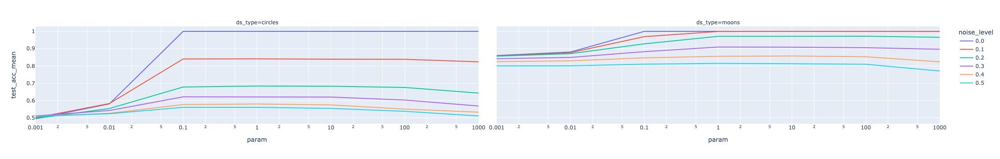

In [24]:
px.line(test_acc_by_conf.reset_index(), x = 'param', log_x=True, y = 'test_acc_mean', color='noise_level', facet_col='ds_type')

Stability:

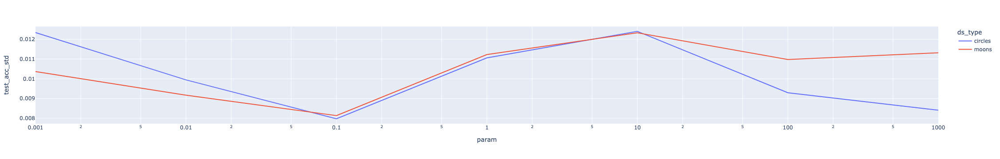

In [25]:
px.line(test_acc_by_conf.query('noise_level == 0.3').reset_index(), x='param',y='test_acc_std',color='ds_type', log_x=True)

Conclusions: 

* For the circles dataset, the best model params for a dataset with 10,000 examples is achieved at gamma=0.1, **regradless the noise level**
* For the moons datasets,  the best model params for a dataset with 10,000 examples is achieved at gamma=1, of 50 samples **regradless the noise level**
* Remember, the higer the gamma, the more capacity the model will have thus:
  * The circles dataset requires less capacity, i.e. less bending is needed to model the pattern without overfitting to the noise.
  * The moons dataset requires more capacity to achieve the same goal
* The fact that regardless the noise, all models needed the same capacity (gamma) to fit the data, means that the training methodoligy (cross-validation) is successful in fitting the pattern without fitting the noise regardeless of noise level.
* **Note!!** - By looking at the table, the conclusions might seem different! that's because a table shows less information than a graph. According to the table, the best param is **noise level dependent**, which is clearly false when looking at the graphs. Why is that?
* **About stablity:**
  * Circels dataset is most stable on the optimal param for test accuracy (gamma=0.1), while moons dataset is most stable on gamma=0.1 but have better test accuracy at gamma=1. What does it tells us? It tells us that we probably have better gamma value somewhere between 0.1 and 1, and we might want to re-run the hyperparam search with proper gamma range

In [26]:
refined_search_results_path = 'data/refined_search_results.csv'

In [27]:
datasets_type = ['moons']
gamma_range = [0.1, 0.3, 0.5, 0.7, 0.9, 1]
n_samples = [10000]
k_folds = 10
clf_types = ['svm']
if os.path.exists(refined_search_results_path):
    new_results_df = pd.read_csv(refined_search_results_path)
else:
    results = run_modeling_experiment(datasets, datasets_type, noise_levels, gamma_range, regularization_values, n_samples, k_folds, clf_types)
    new_results_df = pd.DataFrame(results, columns=['ds_type','n_samples','noise_level','clf_type','param','k','train_acc','test_acc','error_diff'])
    new_results_df.to_csv(refined_search_results_path)

In [28]:
new_test_acc_by_conf = new_results_df.groupby(['ds_type', 'noise_level', 'param']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))

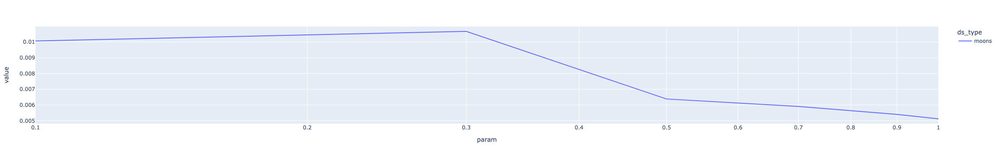

In [29]:
px.line(new_test_acc_by_conf.query('noise_level == 0.3').reset_index(), x='param',y=['test_acc_std'], color='ds_type', log_x=True, )

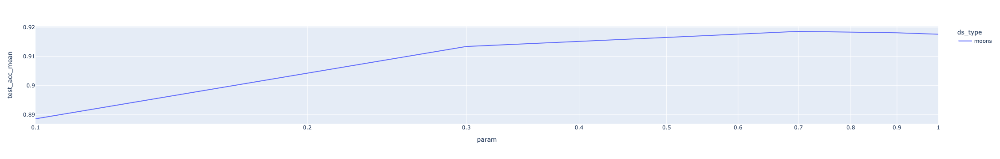

In [30]:
px.line(new_test_acc_by_conf.query('noise_level == 0.3').reset_index(), x='param',y='test_acc_mean',color='ds_type', log_x=True)

### Q2

**For SVM only, For dataset of size 10k and for each dataset, What is the most stable model and model params? How good is it in comparison to other models? Explain using bias and variance terminoligy.** 

In [31]:
test_acc_by_conf.groupby(['ds_type', 'noise_level']).apply(lambda x: pd.Series({'minimal_std': x.test_acc_std.min(), 'most_stable_results_param': x.test_acc_std.idxmin()[-1]}))

minimal_std  most_stable_results_param
ds_type noise_level                                        
circles 0.0             0.000000                       0.10
        0.1             0.007649                     100.00
        0.2             0.009844                       0.01
        0.3             0.007973                       0.10
        0.4             0.007484                       0.01
        0.5             0.009730                       0.01
moons   0.0             0.000000                       0.10
        0.1             0.000483                      10.00
        0.2             0.004295                     100.00
        0.3             0.008135                       0.10
        0.4             0.010220                       1.00
        0.5             0.010304                       1.00

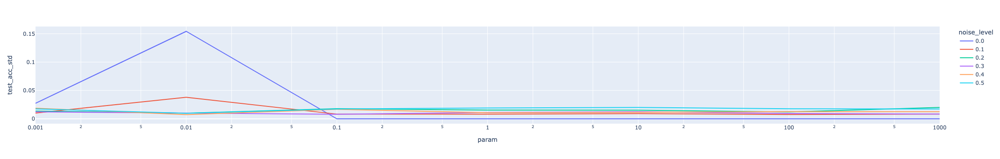

In [32]:
px.line(test_acc_by_conf.loc['circles'].reset_index(), x = 'param', log_x=True, y = 'test_acc_std', color='noise_level')

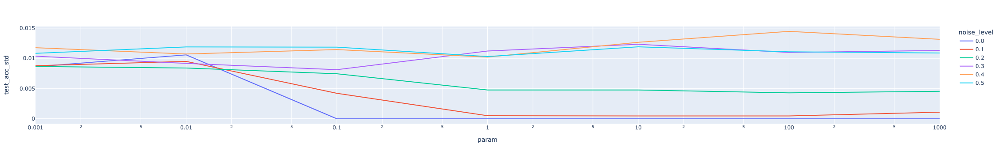

In [33]:
px.line(test_acc_by_conf.loc['moons'].reset_index(), x = 'param', log_x=True, y = 'test_acc_std', color='noise_level')

Conclusions:
* With low noise (0-0.2), underfitting models are less stable (high variance) then properly and overfitting models, and also perform worse (high bias)
* With moderate to high noise (0.3-0.5), underfitting models are equally or less stable then properly fitted models and are more stable than overfitted models

In most real-life datasets, the noise level will be high - thus the statement that low capacity models have high bias (perfrom far from the best performance achievable) but in return have lower variance (are stable) holds. 

### Q3

**Does regularization help for linear models? consider different datasets sizes.**

In [34]:
test_acc_by_conf = results_df.query("clf_type == 'log_reg' and (n_samples == 10000 or n_samples == 50)" ).groupby(['ds_type', 'n_samples','noise_level', 'param']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))
test_acc_by_conf.head()

test_acc_mean  test_acc_std  \
ds_type n_samples noise_level param                                 
circles 50        0.0         0.001            0.40  5.851389e-17   
                              0.010            0.40  5.851389e-17   
                              0.100            0.46  9.660918e-02   
                              1.000            0.54  9.660918e-02   
                              10.000           0.54  9.660918e-02   

                                       test_acc_cv  train_acc_mean  \
ds_type n_samples noise_level param                                  
circles 50        0.0         0.001   5.851389e-17        0.511111   
                              0.010   5.851389e-17        0.511111   
                              0.100   9.660918e-02        0.528889   
                              1.000   9.660918e-02        0.557778   
                              10.000  9.660918e-02        0.555556   

                                      train_acc_std  train_acc_cv  \
ds_type n_samples noise_level param                                 
circles 50        0.0         0.001        0.000000      0.000000   
                              0.010        0.000000      0.000000   
                              0.100        0.052168      0.098638   
                              1.000        0.039821      0.071393   
                              10.000       0.040572      0.073030   

                                      test_train_diff  test_train_diff_percent  
ds_type n_samples noise_level param                                             
circles 50        0.0         0.001          0.111111                21.739130  
                              0.010          0.111111                21.739130  
                              0.100          0.068889                13.025210  
                              1.000          0.017778                 3.187251  
                              10.000         0.015556                 2.800000

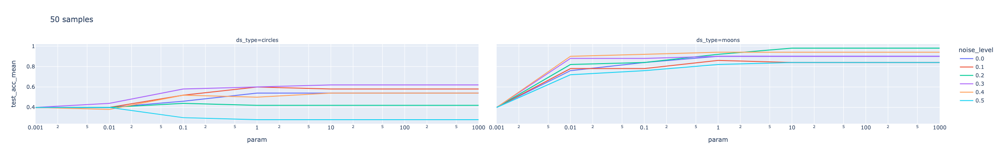

In [35]:
px.line(test_acc_by_conf.reset_index().query('n_samples == 50'), x = 'param', log_x=True, y = 'test_acc_mean', color='noise_level', facet_col='ds_type', title='50 samples')

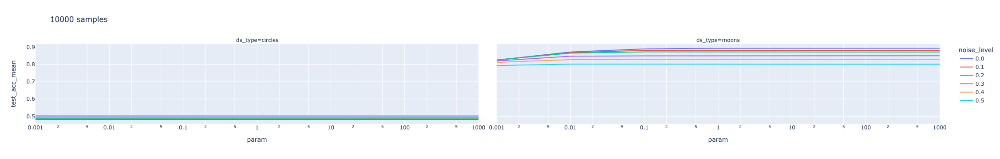

In [36]:
px.line(test_acc_by_conf.reset_index().query('n_samples == 10000'), x = 'param', log_x=True, y = 'test_acc_mean', color='noise_level', facet_col='ds_type', title='10000 samples')

In [37]:
test_acc_by_conf.groupby(['ds_type','n_samples','noise_level']).apply(lambda x: pd.Series({'best_model_acc': x.test_acc_mean.max(), 
                                                                                           'worst_model_acc': x.test_acc_mean.min(),
                                                                                           'best_to_worst_acc_diff': x.test_acc_mean.max() - x.test_acc_mean.min(), 
                                                                                           'best_to_worst_acc_diff_precent': round(100 * (x.test_acc_mean.max() - x.test_acc_mean.min()) / x.test_acc_mean.max(), 2), 
                                                                                           'best_model_reg_param': x.test_acc_mean.idxmax()[-1],
                                                                                           'worst_model_reg_param': x.test_acc_mean.idxmin()[-1]}))

best_model_acc  worst_model_acc  \
ds_type n_samples noise_level                                    
circles 50        0.0                  0.5400           0.4000   
                  0.1                  0.6000           0.4000   
                  0.2                  0.4400           0.4000   
                  0.3                  0.6200           0.4000   
                  0.4                  0.5400           0.3800   
                  0.5                  0.4000           0.2800   
        10000     0.0                  0.4809           0.4807   
                  0.1                  0.4909           0.4907   
                  0.2                  0.4873           0.4871   
                  0.3                  0.4970           0.4967   
                  0.4                  0.4907           0.4903   
                  0.5                  0.5029           0.5026   
moons   50        0.0                  0.9000           0.4000   
                  0.1                  0.8600           0.4000   
                  0.2                  0.9800           0.4000   
                  0.3                  0.9000           0.4000   
                  0.4                  0.9400           0.4000   
                  0.5                  0.8400           0.4000   
        10000     0.0                  0.8938           0.8248   
                  0.1                  0.8813           0.8241   
                  0.2                  0.8719           0.8257   
                  0.3                  0.8497           0.8200   
                  0.4                  0.8292           0.8115   
                  0.5                  0.8014           0.7940   

                               best_to_worst_acc_diff  \
ds_type n_samples noise_level                           
circles 50        0.0                          0.1400   
                  0.1                          0.2000   
                  0.2                          0.0400   
                  0.3                          0.2200   
                  0.4                          0.1600   
                  0.5                          0.1200   
        10000     0.0                          0.0002   
                  0.1                          0.0002   
                  0.2                          0.0002   
                  0.3                          0.0003   
                  0.4                          0.0004   
                  0.5                          0.0003   
moons   50        0.0                          0.5000   
                  0.1                          0.4600   
                  0.2                          0.5800   
                  0.3                          0.5000   
                  0.4                          0.5400   
                  0.5                          0.4400   
        10000     0.0                          0.0690   
                  0.1                          0.0572   
                  0.2                          0.0462   
                  0.3                          0.0297   
                  0.4                          0.0177   
                  0.5                          0.0074   

                               best_to_worst_acc_diff_precent  \
ds_type n_samples noise_level                                   
circles 50        0.0                                   25.93   
                  0.1                                   33.33   
                  0.2                                    9.09   
                  0.3                                   35.48   
                  0.4                                   29.63   
                  0.5                                   30.00   
        10000     0.0                                    0.04   
                  0.1                                    0.04   
                  0.2                                    0.04   
                  0.3                                    0.06   
                  0.4                              

Conclusions:
* In this case, the table presents the answer better than a graph, once the correct questions has been asked.
* The non regularized models are the worst models in both small (50) and large (10,000) datasets and across all noise levels
* The difference between the best and worst models is huge (25% - 59%) when data is low, but much smaller (0% - 8%) when there's enough data
* With moderate to high noise (0.3-0.5), underfitting models are equally or less stable then properly fitted models and are more stable than overfitted models
* On large datasets - The higher the noise, the worst a linear model is performing, but also the less effective is the regularization. 


### Q4

**For a given noise level of your chioce, How does the train, test and difference error changes with increasing data sizes? (answer for svm and LR seperatly)**

In [38]:
acc_by_n_samples = results_df.query("noise_level == 0.3 and param == 1" ).groupby(['ds_type', 'n_samples','clf_type']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))
acc_by_n_samples.head()

test_acc_mean  test_acc_std  test_acc_cv  \
ds_type n_samples clf_type                                             
circles 10        log_reg             0.1      0.316228     0.316228   
                  svm                 0.2      0.421637     0.421637   
        20        log_reg             0.4      0.316228     0.316228   
                  svm                 0.4      0.394405     0.394405   
        50        log_reg             0.6      0.188562     0.188562   

                            train_acc_mean  train_acc_std  train_acc_cv  \
ds_type n_samples clf_type                                                
circles 10        log_reg         0.622222       0.119441      0.191959   
                  svm             0.766667       0.081985      0.106937   
        20        log_reg         0.505556       0.066512      0.131563   
                  svm             0.755556       0.053672      0.071036   
        50        log_reg         0.653333       0.031774      0.048634   

                            test_train_diff  test_train_diff_percent  
ds_type n_samples clf_type                                            
circles 10        log_reg          0.522222                83.928571  
                  svm              0.566667                73.913043  
        20        log_reg          0.105556                20.879121  
                  svm              0.355556                47.058824  
        50        log_reg          0.053333                 8.163265

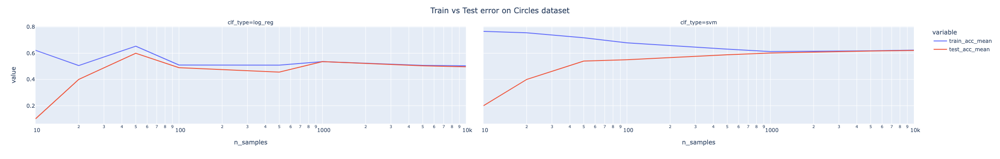

In [39]:
fig = px.line(acc_by_n_samples.loc['circles'].reset_index(), x='n_samples', y=['train_acc_mean', 'test_acc_mean'], facet_col = 'clf_type', log_x=True)
fig.update_layout(title_text='Train vs Test error on Circles dataset', title_x=0.5)

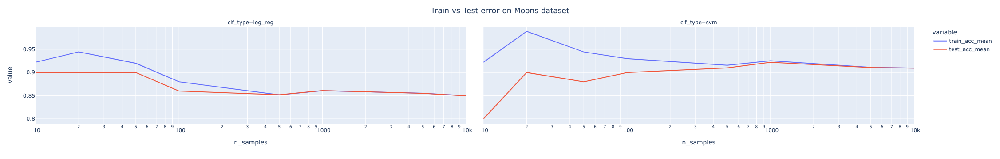

In [40]:
fig = px.line(acc_by_n_samples.loc['moons'].reset_index(), x='n_samples', y=['train_acc_mean', 'test_acc_mean'], facet_col = 'clf_type', log_x=True)
fig.update_layout(title_text='Train vs Test error on Moons dataset', title_x=0.5)

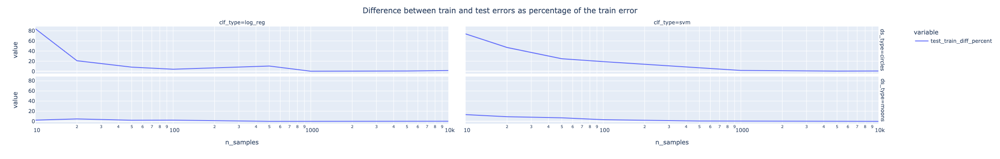

In [41]:
title = 'Difference between train and test errors as percentage of the train error'
fig = px.line(acc_by_n_samples.reset_index(), x='n_samples', y=['test_train_diff_percent'], facet_row='ds_type', facet_col = 'clf_type', log_x=True)
fig.update_layout(title_text=title, title_x=0.5)

Conclusions:
* Remeber that our data is 2d
* We can see that both methods will suffer from low data related overfitting in noisy datasets:
  * On Circles, which is highly non linear dataset, the % difference between train and test can be double digits with < 500 samples
  * On moons, which is much more linearly separable, the trend is the same, but with lower percentage difference. 
  * With same amount of data, linear models will show smaller relative difference between train and test errors (but will also have higher errors) - this is their high bias low overfitting characteristics once again
  * SVM, as a high capacity model, needs more data to achieve similar relative difference as a linear model. 


### Q6

**For a given noise level of your chioce, How does the train, test and difference error changes with increasing model complexity? (answer for svm and LR seperatly)**

**Note**  
SVMs capacity can be increased by increasing gamma. LR capacity can not be increased by regularization, only decreased.  
To incearse a linear model capacity we can use input space augmentation, adding terms like $x^2$, $\sqrt{x}$, $log(x)$ etc. 

In [42]:
acc_by_params = results_df.query("noise_level == 0.3 and n_samples == 1000" ).groupby(['ds_type','clf_type','param']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))
acc_by_params.head()

test_acc_mean  test_acc_std  test_acc_cv  \
ds_type clf_type param                                              
circles log_reg  0.001           0.539      0.035730     0.035730   
                 0.010           0.537      0.035606     0.035606   
                 0.100           0.537      0.035606     0.035606   
                 1.000           0.536      0.037178     0.037178   
                 10.000          0.536      0.037178     0.037178   

                         train_acc_mean  train_acc_std  train_acc_cv  \
ds_type clf_type param                                                 
circles log_reg  0.001         0.535556       0.005316      0.009926   
                 0.010         0.536222       0.004919      0.009174   
                 0.100         0.536222       0.005448      0.010161   
                 1.000         0.536111       0.005720      0.010669   
                 10.000        0.536111       0.005932      0.011064   

                         test_train_diff  test_train_diff_percent  
ds_type clf_type param                                             
circles log_reg  0.001         -0.003444                -0.643154  
                 0.010         -0.000778                -0.145048  
                 0.100         -0.000778                -0.145048  
                 1.000          0.000111                 0.020725  
                 10.000         0.000111                 0.020725

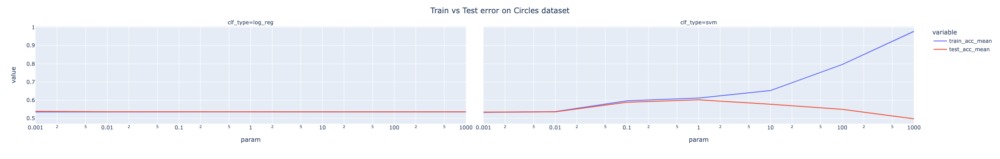

In [43]:
fig = px.line(acc_by_params.loc['circles'].reset_index(), x='param', y=['train_acc_mean', 'test_acc_mean'], facet_col = 'clf_type', log_x=True)
fig.update_layout(title_text='Train vs Test error on Circles dataset', title_x=0.5)

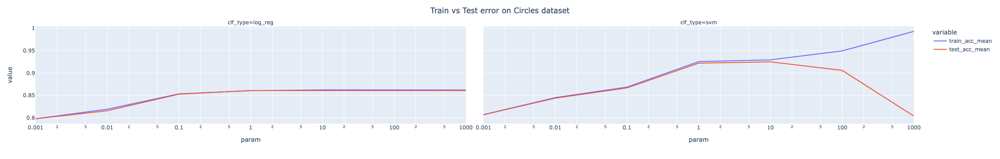

In [44]:
fig = px.line(acc_by_params.loc['moons'].reset_index(), x='param', y=['train_acc_mean', 'test_acc_mean'], facet_col = 'clf_type', log_x=True)
fig.update_layout(title_text='Train vs Test error on Circles dataset', title_x=0.5)

Conclusions:
* As can be expected, the test acceruray increases with increased capacity until optimal capacity is reached, and starts to decrease with further capacity increase as a result of overfitting
* The training accuracy, as expected, only increases as the model's capacity increase, as the model is able to fit more and more of both the pattern and the noise. 
* In the linear case, the graph is showing no difference in train and test errors as the regularization increases (capacity decreases) as the model can't overfit on a 10k dataset to begin with. **A linear model can overfit due to poor amount of samples relative to the inputs dimension**

### Q7

**Are the noise level effect the number of datapoints needed to reach optimal test results?**

In [45]:
test_acc_by_conf = results_df.query("param==1" ).groupby(['clf_type', 'ds_type', 'n_samples', 'noise_level', 'param']).apply(lambda grp: apply_compute_acc_stats(grp, 'train_acc','test_acc'))

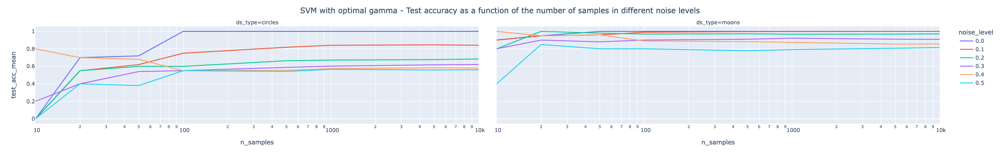

In [46]:
fig = px.line(test_acc_by_conf.loc['svm'].reset_index(), x = 'n_samples', log_x=True, y = 'test_acc_mean', color='noise_level', facet_col='ds_type')
fig.update_layout(title_text='SVM with optimal gamma - Test accuracy as a function of the number of samples in different noise levels', title_x=0.5)


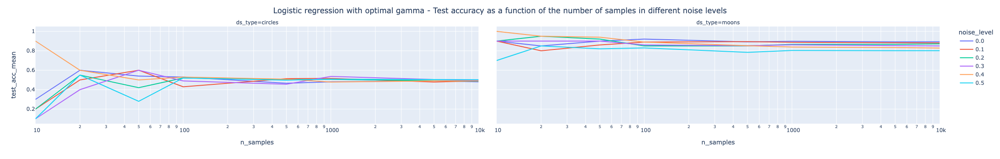

In [47]:
fig = px.line(test_acc_by_conf.loc['log_reg'].reset_index(), x = 'n_samples', log_x=True, y = 'test_acc_mean', color='noise_level', facet_col='ds_type')
fig.update_layout(title_text='Logistic regression with optimal gamma - Test accuracy as a function of the number of samples in different noise levels', title_x=0.5)


Let's look at the relative difference to get a better understanding of the value of more data:

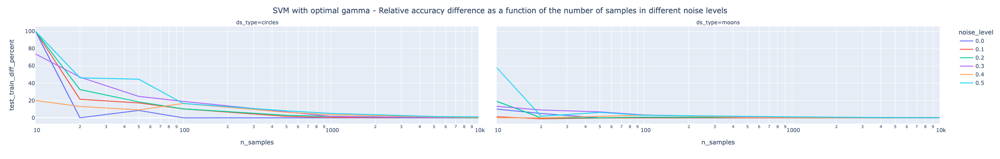

In [48]:
fig = px.line(test_acc_by_conf.loc['svm'].reset_index(), x = 'n_samples', log_x=True, y = 'test_train_diff_percent', color='noise_level', facet_col='ds_type')
fig.update_layout(title_text='SVM with optimal gamma - Relative accuracy difference as a function of the number of samples in different noise levels', title_x=0.5)


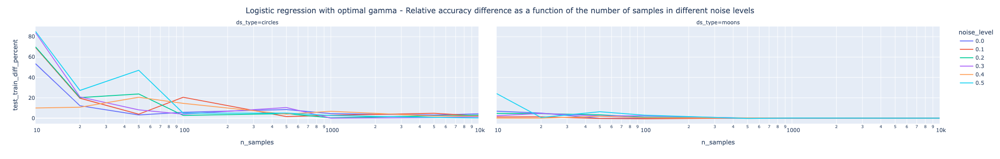

In [49]:
fig = px.line(test_acc_by_conf.loc['log_reg'].reset_index(), x = 'n_samples', log_x=True, y = 'test_train_diff_percent', color='noise_level', facet_col='ds_type')
fig.update_layout(title_text='Logistic regression with optimal gamma - Relative accuracy difference as a function of the number of samples in different noise levels', title_x=0.5)


Conclusions:
* The noisier the data, the more examples are needed to properly (train error close to test error) fit the data. for example:
  * With SVM and 0.1 noise, the relative train-test difference is 1.6% at 500 samples, while for it is 6.3% and 8.3% for 0.4 and 0.5 noise levels. 
  * With LR, the relative train-test difference for 500 samples on the same dataset is 1.4%, 3.9% and 5% for 0.1, 0.4 and 0.5 noise levels. So similarly, we need more data when the noise level increase

## Bonuse Q

Bonus:

* For SVM: Select one dataset and with 0.2 noise level. Identify the optimal model params, and visualize the decision boundry learned. 
  * Hint: Use a grid. See classification models notebook 

In [52]:
from src.experiment import fit_with_svm
def create_grid_dataframe(ds):
    from numpy import linspace, meshgrid
    x_range, y_range = linspace(ds.x.min(), ds.x.max(), 100), linspace(ds.y.min(), ds.y.max(), 100)
    data = [(x,y) for x in x_range for y in y_range]
    data_df = pd.DataFrame(data, columns=['x','y'])
    return data_df

def show_decision_boundry(dataset_name, noise_level, svm_param):
    ds = prepare_dataset_for_k_fold_cv(datasets.query('dataset_name == @dataset_name and noise_level == @noise_level'), n_samples=1000, k=5)
    clf = fit_with_svm(ds[['x', 'y']], ds['label'], param=svm_param)
    grid_df = create_grid_dataframe(ds)
    grid_df['predicted_class'] = clf.predict(grid_df[['x','y']])
    fig = px.scatter(grid_df, x= 'x', y='y', color='predicted_class')    
    fig = fig.update_layout(title_text=f'Decision boundry for noise level {noise_level} and gamma {svm_param}', title_x=0.5)
    return ds, grid_df, fig

In [53]:
ds, grid_df, decision_boundry_fig = show_decision_boundry('circles', 0.2, 1)

In [54]:
ds.head()

,x,y,label,dataset_name,noise_level,fold
0,0.292500,-0.945284,A,circles,0.2,0
1,0.504137,0.983277,A,circles,0.2,1
2,1.065759,0.035786,A,circles,0.2,2
3,1.286958,0.282838,A,circles,0.2,3
4,-0.465203,0.662520,A,circles,0.2,4


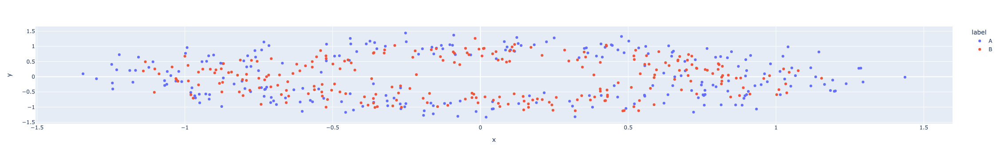

In [55]:
dataset_fig = px.scatter(ds.sample(500), x='x',y='y', color='label')
dataset_fig

In [56]:
grid_df.shape

(10000, 3)

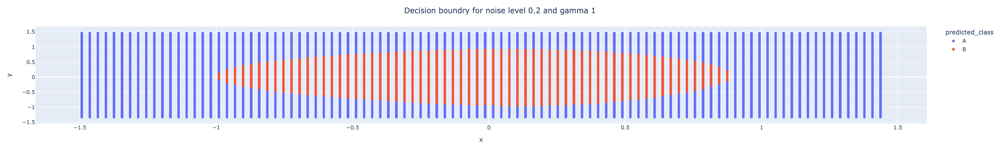

In [57]:
decision_boundry_fig

### Comparing decision boundries

With optimal svm param, we can see that the noise does not prevent us from identifying the pattern:

#### Optimal gamma (0.1) 

In [58]:
all_grids = pd.DataFrame()
for noise_level in [0, 0.1, 0.2, 0.3, 0.4, 0.5]:
    grid = show_decision_boundry('circles', noise_level, svm_param=0.1)[1]
    grid['noise_level'] = noise_level
    all_grids = all_grids.append(grid)

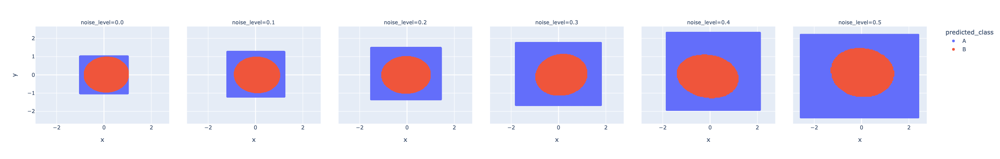

In [59]:
px.scatter(all_grids, x='x', y='y', color='predicted_class', facet_col='noise_level')

#### Maximum capacity gamma (overiftting) 

In [60]:
all_grids = pd.DataFrame()
for noise_level in [0, 0.1, 0.2, 0.3, 0.4, 0.5]:
    grid = show_decision_boundry('circles', noise_level, svm_param=1000)[1]
    grid['noise_level'] = noise_level
    all_grids = all_grids.append(grid)

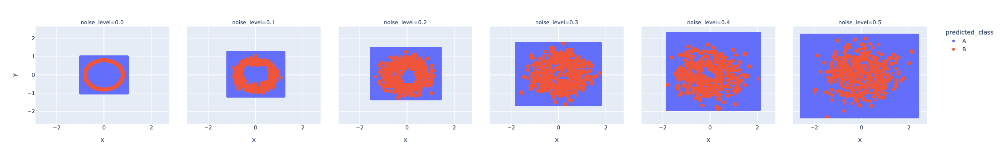

In [61]:
px.scatter(all_grids, x='x', y='y', color='predicted_class', facet_col='noise_level')

Conclusions:
* With the correct capacity, the pattern is detected regardless of the error. 
* With non-bounded capacity, we fit the noise without fitting the pattern
* **Important Note**:
  * Notice that in neither case we actually identify the true pattern - which is that each class is located in a seperate ring. Why is that?